# Simple implementation of Principal component analysis

Principal component analysis is a simple yet powerfull tool. Machine learning/Deep learning represent information in terms of high-dimensional vectors which are hard to visualize if plotted as such. One of the application of PCA is visualizing multidimensional data by plotting them on 2-D plot. Now this might not seem interesting, one might say, Just plot the data on x-y plane , but it's not just about plotting, rather we want to see the truest picture possible.

As a simple example, consider 2 points in 3-D space A(1,0,0) and B(2,0,0). We want a 2-D picture, so let's project these points into X-Y plane and Y-Z plane and X-Z plane : A_xy(1,0), B_xy(1,0) and A_yz(0,0) , B_yz(0,0) and A_xz(1,0) , B_xz(1,0). The Y-Z representation is useless in the sense that it does not give us the true picture of the data set. Thus, we need to choose an optimal 2-D plane to project our data upon.

If we want to convert n-D data into k-D data we want a k-D optimal plane. PCA says that the k-axes of this optimal k-D plane are ** k-eigen vectors corresponding to largest k eigen values of X<sup>T</sup>X **, where X is the matrix representing the data.[Proof here](https://www.deeplearningbook.org/contents/linear_algebra.html).

The Code first shows a toy example of encodeing 3-D data into 2-D values and then shows how Learned representation of MNIST data form a beautiful patter in 2-D space.

In [11]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

X is the dataset we want to represent in some lower dimensional space. Each row of X represents a point in n-D space where n is the size of each row ( i.e. no of columns ). Here n = 3, in order to plot the numbers using pyplot. Our aim is to convert each 3-D point into 2-D point while preserving as much information as we can. In other words ** if we needed to convert this compressed 2-D representation into 3-D representation again, we should be as near to the real values as possible** i.e. the overall error must be as small as possible. Lossely speaking , we aim to minimize || g(C) - X ||<sub>F</sub> where C is compressed representation and g is the decoder function.and F represents Frobeous Norm.)

In [12]:
X = np.random.rand(10000,3)
print(X)

[[0.3378193  0.40342106 0.89503228]
 [0.55823819 0.03247564 0.36014167]
 [0.98451432 0.69495369 0.91537199]
 ...
 [0.36572589 0.33546524 0.21566714]
 [0.22303086 0.49253378 0.92518732]
 [0.32608043 0.93599626 0.56362729]]


Calculating the eigen vectors and eigen values of X<sup>T</sup>X .

In [13]:
import numpy.linalg as LA
eigen_val,eigen_vec = LA.eigh(np.transpose(X) @ X)
print(eigen_val)
print(eigen_vec)

[ 819.6381135   839.92024709 8361.14041103]
[[ 0.15696577 -0.80332026 -0.5744896 ]
 [-0.76995926  0.26474946 -0.5805777 ]
 [ 0.61848564  0.53346441 -0.57696727]]


To decode data into 2-D space we want 2 eigen vectors corresponding to 2-largest eigen values. The eigen values produced by numpy.linalg.eigh are already in increasing order so we just choose the last 2 vectors from the list. D contains the required 2 vectors.

Note : All the eigen values are real because the X<sup>T</sup>X is a real symmetric matrix. This allows us to define the ordering .In addition to this the eigen vectors are orthonormal to each other ( again because the concerned matrix is a real symmetric matrix.) This satisfies the two condition mentioned in the [proof](https://www.deeplearningbook.org/contents/linear_algebra.html):

>    - All eigen vectors in matrix D should be orthogonal to each other.( D is not a square matrix so avoiding " D is orthogonal matrix")
>    - DD<sup>T</sup> = I

In [14]:
D = eigen_vec[-2:,:]
print(D)

[[-0.76995926  0.26474946 -0.5805777 ]
 [ 0.61848564  0.53346441 -0.57696727]]


In [15]:
print(X.shape)
print(D.shape)

(10000, 3)
(2, 3)


In current numpy representation row represent an eigen vector ( A bit different from proof where column represent eigen vectors.) We define the Encoding function f and decoding function g ( @ represent matrix multiplication ):
>   - g(c) = c @ D ( Consider General D )
>   - f(x) = c = x @ D<sup>T</sup> ( Choose best c given D)
>   - D = { k eigen vectors corresponding to k-highest eigen values }  ( Choose D such that total error is minimum ).

Quoting from proof : 

>    "PCA is defined by our choice of the decoding function.Specifically, to make the
>    decoder very simple, we choose to use matrix multiplication to map the code back
>    into R<sup>n</sup> . Let g( c ) = Dc , where D ∈ R <sup>n×l</sup> is the matrix defining the decoding."

Notice the difference in order of multiplication. The given formula implements same things just in different order.

In [16]:
C = X @ np.transpose(D)
print("------Encoded values ---\n",C)
X_approx = C @ D
print("------Decoded values ---\n",X_approx)

------Encoded values ---
 [[-0.67293737 -0.09225717]
 [-0.63031298  0.15479695]
 [-1.10549187  0.45150136]
 ...
 [-0.31799133  0.2807221 ]
 [-0.57846975 -0.13311217]
 [-0.33049358  0.37580226]]
------Decoded values ---
 [[ 0.46107462 -0.22737572  0.4439218 ]
 [ 0.581055   -0.08429636  0.27663289]
 [ 1.1304308  -0.05181847  0.38132242]
 ...
 [ 0.41846295  0.06556722  0.02265121]
 [ 0.36307017 -0.22416016  0.41264801]
 [ 0.48689489  0.11297913 -0.0249484 ]]


In [17]:
class drawline():
    def __init__(self,P1,P2,axis,color='pink'):
        self.P1 = P1
        self.P2 = P2
        self.color = color
        self.axis = axis

    def draw(self):
        x = [self.P1[0],self.P2[0]]
        y = [self.P1[1],self.P2[1]]
        z = [self.P1[2],self.P2[2]]
        ax = self.axis
        c = self.color
        ax.plot3D(x,y,z,c=c)

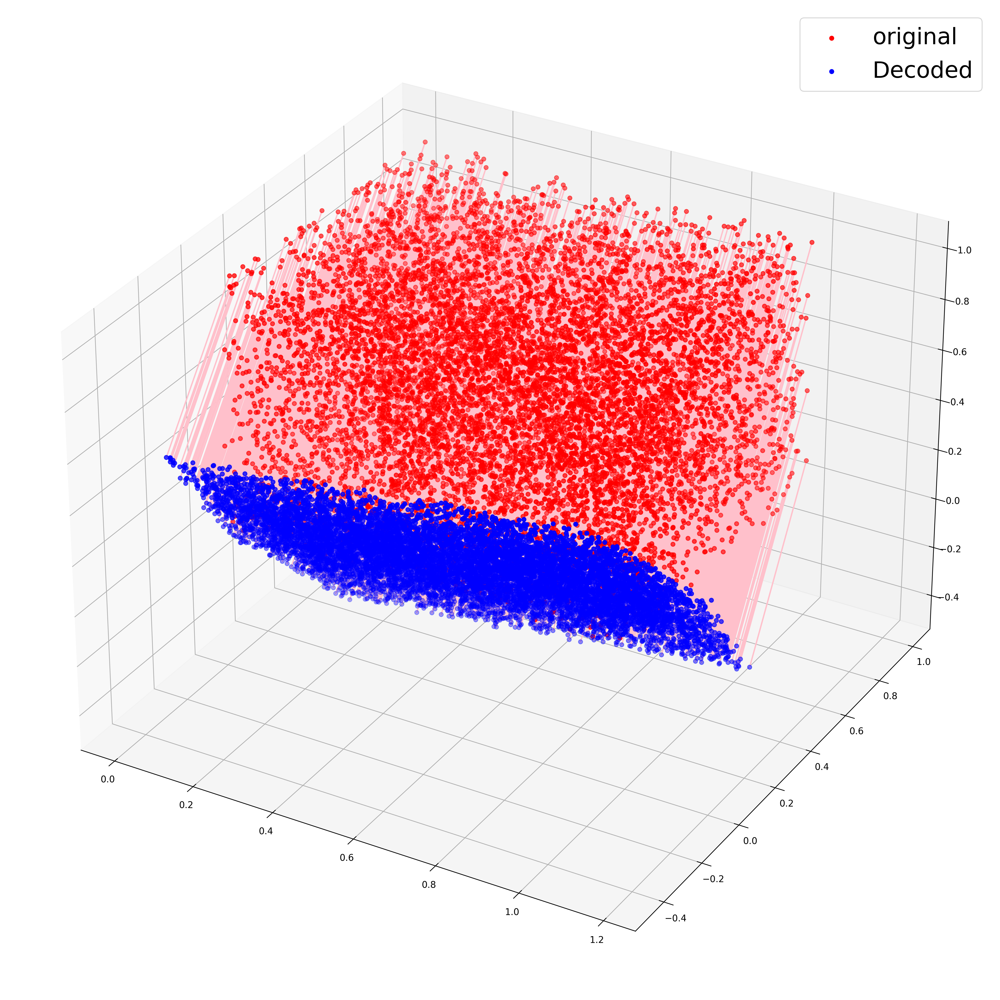

In [18]:
from mpl_toolkits import mplot3d

plt.rcParams['legend.fontsize'] = 25
fig1 = plt.figure(figsize=(20,20),dpi=300)
ax = plt.axes(projection = '3d')
ax.scatter3D(X[:,0],X[:,1],X[:,2],c='red',label='original')
ax.scatter3D(X_approx[:,0],X_approx[:,1],X_approx[:,2],c='blue',label='Decoded')
ax.legend()

i = 0
for x in X:
    x_approx = X_approx[i]
    i+=1
    line = drawline(x,x_approx,axis=ax)
    line.draw()


## PCA gives us a direction to look along for truest picture.

The Graph above shows the working of PCA as follows : You encode the original 3-D data( red color ) into 2-D data ( green dots in graph below ). Now we wish to decode this encoded data again. In order to do so we are multiplying C by D where D consists of only 2 suitable eigen vectors each of length 3. ** The decoded values will all lie on a plane as the decoded points are just linear combination of these 2 eigen vectors **. So for n-D to k-D encoding we will need an optimal k-D plane to store the decoding and then we will generate an equivalent k-D plane(space) consisting of n-dimensional points ( Here we generated 2-D plane formed by 3-dimensional points ) and this k-D plane will be the truest picture we can obtain.

So, We now have the explanation to our initial example for points A(1,0,0) and B(2,0,0). We could have choosen any plane parallel to x-axis but not Y-Z. In fact the planes containing x-axis are the best as they will decode into exact same picture of the two points.

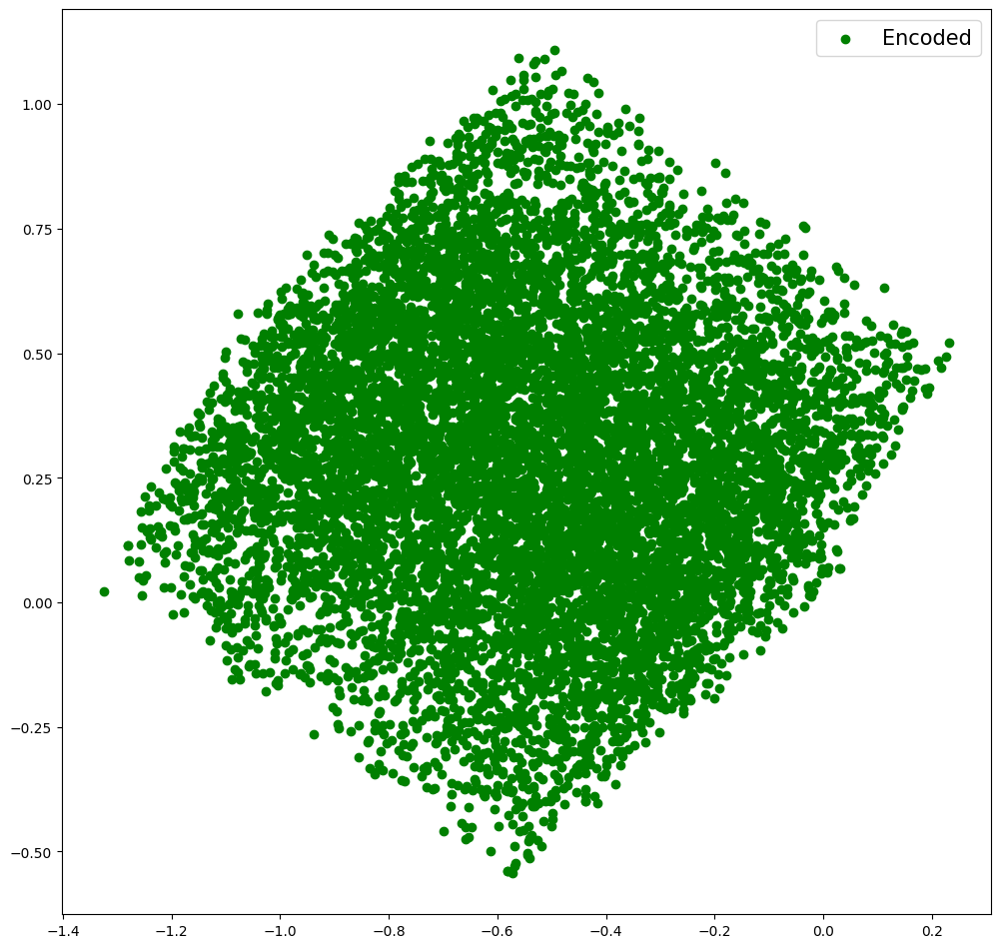

In [19]:
fig2 = plt.figure(figsize=(12,12),dpi=100)

plt.rcParams['legend.fontsize'] = 15 
ax = plt.axes()
ax.scatter(C[:,0],C[:,1],c='green',label='Encoded')
ax.legend()

## Practical Use :
